In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.subplots
import plotly.express as px

In [2]:
data=pd.read_csv(f'StudentPerformanceFactors.csv')
data.head(10)

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,Low,High,No,7,73,Low,Yes,0,Low,Medium,Public,Positive,3,No,High School,Near,Male,67
1,19,64,Low,Medium,No,8,59,Low,Yes,2,Medium,Medium,Public,Negative,4,No,College,Moderate,Female,61
2,24,98,Medium,Medium,Yes,7,91,Medium,Yes,2,Medium,Medium,Public,Neutral,4,No,Postgraduate,Near,Male,74
3,29,89,Low,Medium,Yes,8,98,Medium,Yes,1,Medium,Medium,Public,Negative,4,No,High School,Moderate,Male,71
4,19,92,Medium,Medium,Yes,6,65,Medium,Yes,3,Medium,High,Public,Neutral,4,No,College,Near,Female,70
5,19,88,Medium,Medium,Yes,8,89,Medium,Yes,3,Medium,Medium,Public,Positive,3,No,Postgraduate,Near,Male,71
6,29,84,Medium,Low,Yes,7,68,Low,Yes,1,Low,Medium,Private,Neutral,2,No,High School,Moderate,Male,67
7,25,78,Low,High,Yes,6,50,Medium,Yes,1,High,High,Public,Negative,2,No,High School,Far,Male,66
8,17,94,Medium,High,No,6,80,High,Yes,0,Medium,Low,Private,Neutral,1,No,College,Near,Male,69
9,23,98,Medium,Medium,Yes,8,71,Medium,Yes,0,High,High,Public,Positive,5,No,High School,Moderate,Male,72


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6607 entries, 0 to 6606
Data columns (total 20 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Hours_Studied               6607 non-null   int64 
 1   Attendance                  6607 non-null   int64 
 2   Parental_Involvement        6607 non-null   object
 3   Access_to_Resources         6607 non-null   object
 4   Extracurricular_Activities  6607 non-null   object
 5   Sleep_Hours                 6607 non-null   int64 
 6   Previous_Scores             6607 non-null   int64 
 7   Motivation_Level            6607 non-null   object
 8   Internet_Access             6607 non-null   object
 9   Tutoring_Sessions           6607 non-null   int64 
 10  Family_Income               6607 non-null   object
 11  Teacher_Quality             6529 non-null   object
 12  School_Type                 6607 non-null   object
 13  Peer_Influence              6607 non-null   obje

In [4]:
data.describe()

,Hours_Studied,Attendance,Sleep_Hours,Previous_Scores,Tutoring_Sessions,Physical_Activity,Exam_Score
count,6607.000000,6607.000000,6607.00000,6607.000000,6607.000000,6607.000000,6607.000000
mean,19.975329,79.977448,7.02906,75.070531,1.493719,2.967610,67.235659
std,5.990594,11.547475,1.46812,14.399784,1.230570,1.031231,3.890456
min,1.000000,60.000000,4.00000,50.000000,0.000000,0.000000,55.000000
25%,16.000000,70.000000,6.00000,63.000000,1.000000,2.000000,65.000000
50%,20.000000,80.000000,7.00000,75.000000,1.000000,3.000000,67.000000
75%,24.000000,90.000000,8.00000,88.000000,2.000000,4.000000,69.000000
max,44.000000,100.000000,10.00000,100.000000,8.000000,6.000000,101.000000


In [5]:
data.columns

Index(['Hours_Studied', 'Attendance', 'Parental_Involvement',
       'Access_to_Resources', 'Extracurricular_Activities', 'Sleep_Hours',
       'Previous_Scores', 'Motivation_Level', 'Internet_Access',
       'Tutoring_Sessions', 'Family_Income', 'Teacher_Quality', 'School_Type',
       'Peer_Influence', 'Physical_Activity', 'Learning_Disabilities',
       'Parental_Education_Level', 'Distance_from_Home', 'Gender',
       'Exam_Score'],
      dtype='object')

In [6]:
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.metrics import accuracy_score,r2_score,precision_score

In [7]:
Le=LabelEncoder()
encoded=Le.fit_transform(data['Parental_Involvement'])
encoded1=Le.fit_transform(data['Access_to_Resources'])
encoded2=Le.fit_transform(data['Extracurricular_Activities'])
encoded3=Le.fit_transform(data['Motivation_Level'])
encoded4=Le.fit_transform(data['Internet_Access'])
encoded5=Le.fit_transform(data['Family_Income'])
encoded6=Le.fit_transform(data['Teacher_Quality'])
encoded7=Le.fit_transform(data['School_Type'])
encoded8=Le.fit_transform(data['Peer_Influence'])
encoded9=Le.fit_transform(data['Learning_Disabilities'])
encoded10=Le.fit_transform(data['Parental_Education_Level'])
encoded11=Le.fit_transform(data['Distance_from_Home'])
encoded12=Le.fit_transform(data['Gender'])

In [8]:
data['Parental_Involvement']=encoded
data['Access_to_Resources']=encoded1
data['Extracurricular_Activities']=encoded2
data['Motivation_Level']=encoded3
data['Internet_Access']=encoded4
data['Family_Income']=encoded5
data['Teacher_Quality']=encoded6
data['School_Type']=encoded7
data['Peer_Influence']=encoded8
data['Learning_Disabilities']=encoded9
data['Parental_Education_Level']=encoded10
data['Distance_from_Home']=encoded11
data['Gender']=encoded12

In [9]:
data

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,23,84,1,0,0,7,73,1,1,0,1,2,1,2,3,0,1,2,1,67
1,19,64,1,2,0,8,59,1,1,2,2,2,1,0,4,0,0,1,0,61
2,24,98,2,2,1,7,91,2,1,2,2,2,1,1,4,0,2,2,1,74
3,29,89,1,2,1,8,98,2,1,1,2,2,1,0,4,0,1,1,1,71
4,19,92,2,2,1,6,65,2,1,3,2,0,1,1,4,0,0,2,0,70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6602,25,69,0,2,0,7,76,2,1,1,0,2,1,2,2,0,1,2,0,68
6603,23,76,0,2,0,8,81,2,1,3,1,0,1,2,2,0,1,2,0,69
6604,20,90,2,1,1,6,65,1,1,3,1,2,1,0,2,0,2,2,0,68
6605,10,86,0,0,1,6,91,0,1,2,1,2,0,2,3,0,1,0,0,68


In [10]:
corr_data=data.corr()

In [11]:
corr_data

,Hours_Studied,Attendance,Parental_Involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Scores,Motivation_Level,Internet_Access,Tutoring_Sessions,Family_Income,Teacher_Quality,School_Type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
Hours_Studied,1.000000,-0.009908,0.007207,-0.007909,-0.006017,0.010977,0.024846,0.022092,0.005038,-0.014282,0.010025,0.003897,0.000299,0.009698,0.004624,-0.014401,0.012350,-0.015567,-0.004241,0.445455
Attendance,-0.009908,1.000000,-0.004940,0.000862,-0.002222,-0.015918,-0.020186,0.013098,-0.018318,0.014324,-0.008097,-0.008709,-0.018645,-0.007519,-0.022435,-0.022231,0.014896,0.015704,0.008040,0.581072
Parental_Involvement,0.007207,-0.004940,1.000000,0.010476,0.022225,0.001280,0.005094,-0.013449,0.001863,-0.007655,0.005080,-0.004339,-0.003376,-0.008446,0.007986,-0.010800,0.017472,-0.003684,0.024656,-0.094289
Access_to_Resources,-0.007909,0.000862,0.010476,1.000000,-0.009579,-0.004738,-0.002976,-0.010507,0.002304,0.010928,0.010485,0.011405,0.030449,0.009301,0.037976,0.004880,-0.006918,0.013053,0.006381,-0.090503
Extracurricular_Activities,-0.006017,-0.002222,0.022225,-0.009579,1.000000,0.001379,0.004354,-0.006758,-0.005345,0.003192,0.015102,-0.004376,0.005655,0.009142,-0.001032,-0.008288,-0.014010,-0.012010,0.007945,0.064382
Sleep_Hours,0.010977,-0.015918,0.001280,-0.004738,0.001379,1.000000,-0.021750,0.000257,0.011901,-0.012216,0.011030,-0.005881,0.002775,-0.016867,-0.000378,0.015392,-0.006321,-0.000548,-0.007479,-0.017022
Previous_Scores,0.024846,-0.020186,0.005094,-0.002976,0.004354,-0.021750,1.000000,-0.021620,0.004304,-0.013122,0.011847,-0.018714,0.013452,-0.017982,-0.011274,0.007057,0.008704,0.005570,0.001021,0.175079
Motivation_Level,0.022092,0.013098,-0.013449,-0.010507,-0.006758,0.000257,-0.021620,1.000000,0.000343,-0.012456,-0.009552,0.012447,-0.005520,0.003372,-0.003599,-0.018126,0.014645,0.014858,0.001173,-0.014910
Internet_Access,0.005038,-0.018318,0.001863,0.002304,-0.005345,0.011901,0.004304,0.000343,1.000000,-0.010071,0.016600,-0.001776,0.012786,-0.010429,-0.012867,0.006517,0.025502,-0.010227,0.015139,0.051475
Tutoring_Sessions,-0.014282,0.014324,-0.007655,0.010928,0.003192,-0.012216,-0.013122,-0.012456,-0.010071,1.000000,-0.002109,-0.001025,0.008257,-0.005139,0.017733,0.007564,-0.004683,0.016716,-0.006734,0.156525


In [12]:
standerd=StandardScaler()
standerd_data=standerd.fit_transform(data)

In [13]:
standerd_data

array([[ 0.50494151,  0.34837541, -0.25424875, ...,  0.71731608,
         0.85574648, -0.06057825],
       [-0.16282241, -1.38373605, -0.25424875, ..., -0.74227965,
        -1.16857039, -1.60293072],
       [ 0.67188249,  1.56085343,  0.90106177, ...,  0.71731608,
         0.85574648,  1.73883298],
       ...,
       [ 0.00411857,  0.86800885,  0.90106177, ...,  0.71731608,
        -1.16857039,  0.1964805 ],
       [-1.66529123,  0.52158655, -1.40955928, ..., -2.20187539,
        -1.16857039,  0.1964805 ],
       [-0.83058633, -1.12391933,  0.90106177, ...,  0.71731608,
         0.85574648, -0.83175448]])

In [14]:
standerd_data=pd.DataFrame(standerd_data)

In [15]:
standerd_data

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.504942,0.348375,-0.254249,-1.380517,-1.214685,-0.019796,-0.143800,-0.393061,0.285825,-1.213934,-0.284883,0.742375,0.661006,1.070550,0.031411,-0.342867,0.103120,0.717316,0.855746,-0.060578
1,-0.162822,-1.383736,-0.254249,0.913804,-1.214685,0.661399,-1.116110,-0.393061,0.285825,0.411451,1.062448,0.742375,0.661006,-1.575587,1.001199,-0.342867,-1.248688,-0.742280,-1.168570,-1.602931
2,0.671882,1.560853,0.901062,0.913804,0.823259,-0.019796,1.106313,0.884966,0.285825,0.411451,1.062448,0.742375,0.661006,-0.252518,1.001199,-0.342867,1.454927,0.717316,0.855746,1.738833
3,1.506587,0.781403,-0.254249,0.913804,0.823259,0.661399,1.592469,0.884966,0.285825,-0.401242,1.062448,0.742375,0.661006,-1.575587,1.001199,-0.342867,0.103120,-0.742280,0.855746,0.967657
4,-0.162822,1.041220,0.901062,0.913804,0.823259,-0.700990,-0.699406,0.884966,0.285825,1.224144,1.062448,-1.450726,0.661006,-0.252518,1.001199,-0.342867,-1.248688,0.717316,-1.168570,0.710598
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6602,0.838823,-0.950708,-1.409559,0.913804,-1.214685,-0.019796,0.064552,0.884966,0.285825,-0.401242,-1.632214,0.742375,0.661006,1.070550,-0.938377,-0.342867,0.103120,0.717316,-1.168570,0.196481
6603,0.504942,-0.344469,-1.409559,0.913804,-1.214685,0.661399,0.411806,0.884966,0.285825,1.224144,-0.284883,-1.450726,0.661006,1.070550,-0.938377,-0.342867,0.103120,0.717316,-1.168570,0.453539
6604,0.004119,0.868009,0.901062,-0.233356,0.823259,-0.700990,-0.699406,-0.393061,0.285825,1.224144,-0.284883,0.742375,0.661006,-1.575587,-0.938377,-0.342867,1.454927,0.717316,-1.168570,0.196481
6605,-1.665291,0.521587,-1.409559,-1.380517,0.823259,-0.700990,1.106313,-1.671088,0.285825,0.411451,-0.284883,0.742375,-1.512845,1.070550,0.031411,-0.342867,0.103120,-2.201875,-1.168570,0.196481


In [16]:
standerd_data=standerd_data.rename(columns={0:'Hours_studied',1:'Attendance',2:'Parental_involvement',3:'Access_to_Resources',4:'Extracurricular_Activities',5:'Sleep_Hours',
                              6:'Previous_Score',7:'Motivtional_level',8:'Internet_Access',9:'Tutoring_Session',10:'Famile_Income',11:'Teacher_Quality',12:'School_type',
                              13:'Peer_Influence',14:'Physical_Activity',15:'Learning_Disabilities',
                              16:'Parental_Education_Level',17:'Distance_from_Home',18:'Gender',
                              19:'Exam_Score'})

In [17]:
standerd_data.head(5)

,Hours_studied,Attendance,Parental_involvement,Access_to_Resources,Extracurricular_Activities,Sleep_Hours,Previous_Score,Motivtional_level,Internet_Access,Tutoring_Session,Famile_Income,Teacher_Quality,School_type,Peer_Influence,Physical_Activity,Learning_Disabilities,Parental_Education_Level,Distance_from_Home,Gender,Exam_Score
0,0.504942,0.348375,-0.254249,-1.380517,-1.214685,-0.019796,-0.143800,-0.393061,0.285825,-1.213934,-0.284883,0.742375,0.661006,1.070550,0.031411,-0.342867,0.103120,0.717316,0.855746,-0.060578
1,-0.162822,-1.383736,-0.254249,0.913804,-1.214685,0.661399,-1.116110,-0.393061,0.285825,0.411451,1.062448,0.742375,0.661006,-1.575587,1.001199,-0.342867,-1.248688,-0.742280,-1.168570,-1.602931
2,0.671882,1.560853,0.901062,0.913804,0.823259,-0.019796,1.106313,0.884966,0.285825,0.411451,1.062448,0.742375,0.661006,-0.252518,1.001199,-0.342867,1.454927,0.717316,0.855746,1.738833
3,1.506587,0.781403,-0.254249,0.913804,0.823259,0.661399,1.592469,0.884966,0.285825,-0.401242,1.062448,0.742375,0.661006,-1.575587,1.001199,-0.342867,0.103120,-0.742280,0.855746,0.967657
4,-0.162822,1.041220,0.901062,0.913804,0.823259,-0.700990,-0.699406,0.884966,0.285825,1.224144,1.062448,-1.450726,0.661006,-0.252518,1.001199,-0.342867,-1.248688,0.717316,-1.168570,0.710598


<Figure size 1200x1500 with 0 Axes>

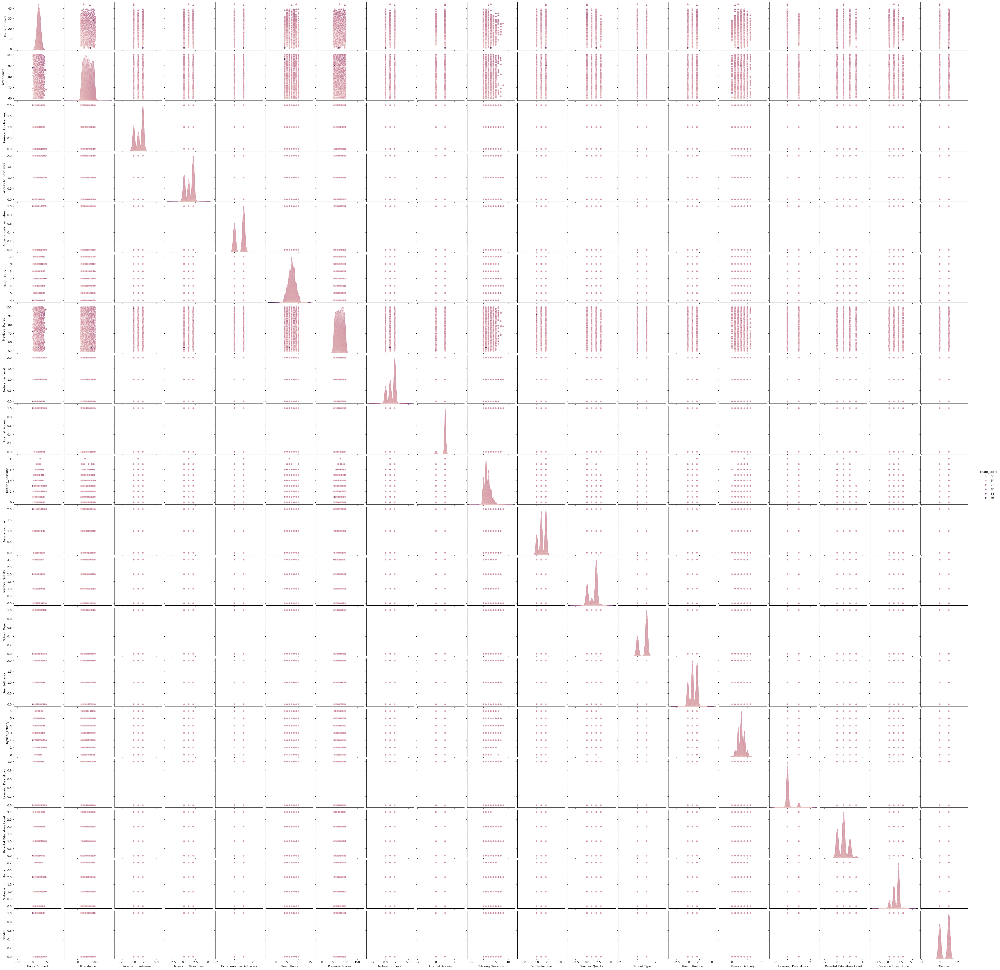

In [18]:
plt.figure(figsize=(12,15))
sns.pairplot(data[['Hours_Studied', 'Attendance', 'Parental_Involvement',
       'Access_to_Resources', 'Extracurricular_Activities', 'Sleep_Hours',
       'Previous_Scores', 'Motivation_Level', 'Internet_Access',
       'Tutoring_Sessions', 'Family_Income', 'Teacher_Quality', 'School_Type',
       'Peer_Influence', 'Physical_Activity', 'Learning_Disabilities',
       'Parental_Education_Level', 'Distance_from_Home', 'Gender',
       'Exam_Score']],hue='Exam_Score')

<Axes: >

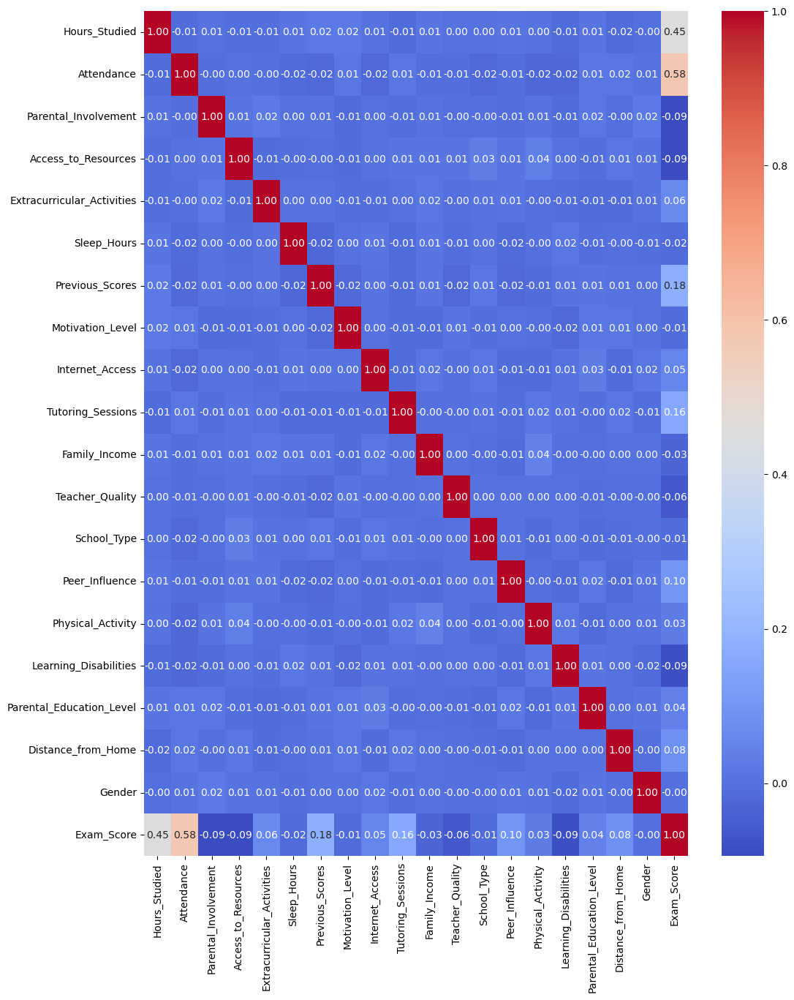

In [19]:
plt.figure(figsize=(12,15))
sns.heatmap(corr_data,annot=True,cmap='coolwarm',fmt='.2f')

Text(0.5, 0.92, 'Exam score')

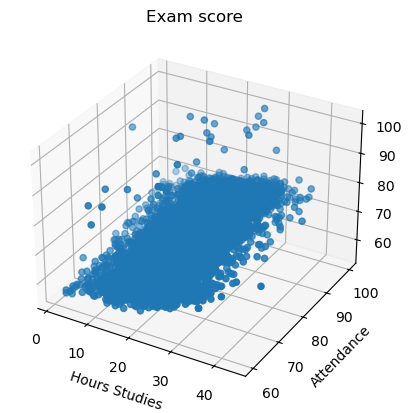

In [20]:
from mpl_toolkits.mplot3d import Axes3D
fig=plt.figure()
ax=fig.add_subplot(111,projection='3d')
ax.scatter(data['Hours_Studied'],data['Attendance'],data['Exam_Score'])
plt.xlabel('Hours Studies')
plt.ylabel('Attendance')
plt.title('Exam score')

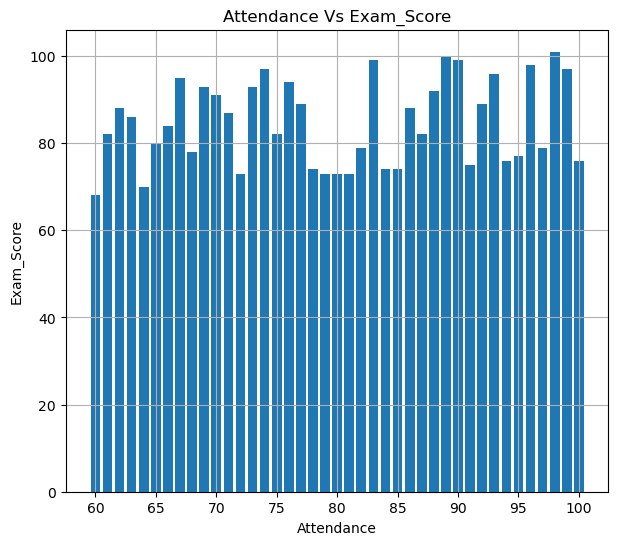

In [21]:
plt.figure(figsize=(7,6))
plt.bar(data['Attendance'],data['Exam_Score'])
plt.xlabel('Attendance')
plt.ylabel('Exam_Score')
plt.title('Attendance Vs Exam_Score')
plt.grid()
plt.show()


C:\Users\Master\AppData\Local\Temp\ipykernel_6236\4127008137.py:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


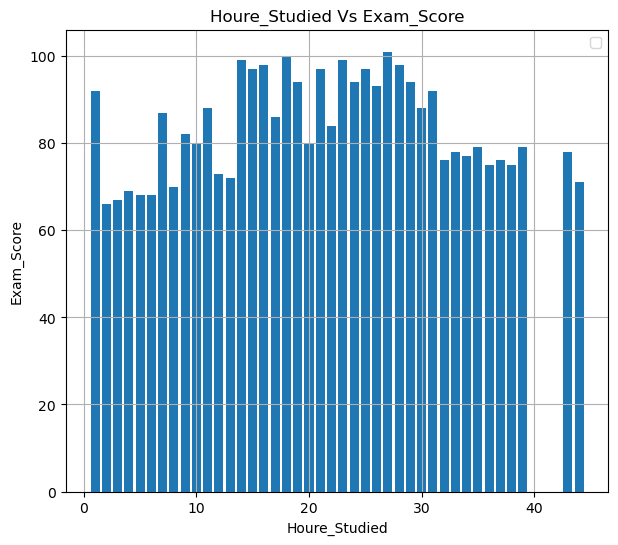

In [22]:
plt.figure(figsize=(7,6))
plt.bar(data['Hours_Studied'],data['Exam_Score'])
plt.xlabel('Houre_Studied')
plt.ylabel('Exam_Score')
plt.title('Houre_Studied Vs Exam_Score')
plt.legend()
plt.grid()
plt.show()

([<matplotlib.patches.Wedge at 0x1d5ea279a00>,
 [Text(-1.0677513495091506, -0.2643994243968542, '1'),
  Text(1.0677513742640066, 0.2643993244267568, '0')],
 [Text(-0.5824098270049912, -0.14421786785282956, '57.7%'),
  Text(0.5824098405076399, 0.1442178133236855, '42.3%')])

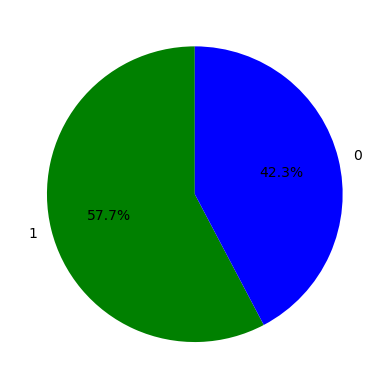

In [23]:
counts=data['Gender'].value_counts()
plt.pie(counts,labels=counts.index, autopct='%1.1f%%',startangle=90,colors=['green', 'blue','#169976'])


Text(0.5, 1.0, 'Exame_Score Destribution')

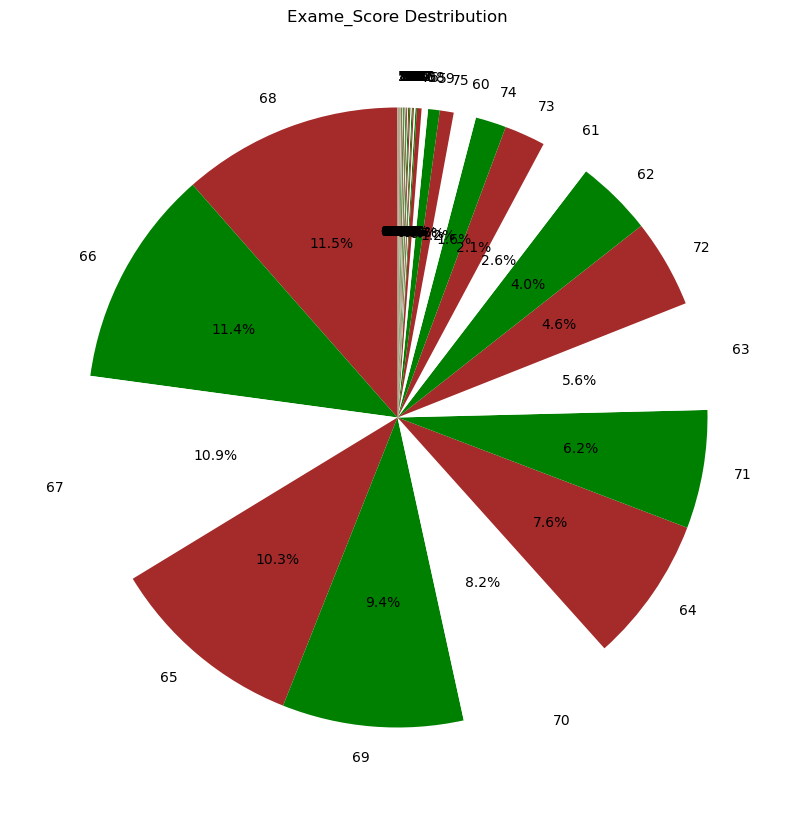

In [24]:
counts1=data['Exam_Score'].value_counts()
plt.figure(figsize=(10,12))
plt.pie(counts1,labels=counts1.index,startangle=90,autopct='%1.1f%%',colors=['brown','green','white'])
plt.title('Exame_Score Destribution')

<Axes: xlabel='Exam_Score', ylabel='Count'>

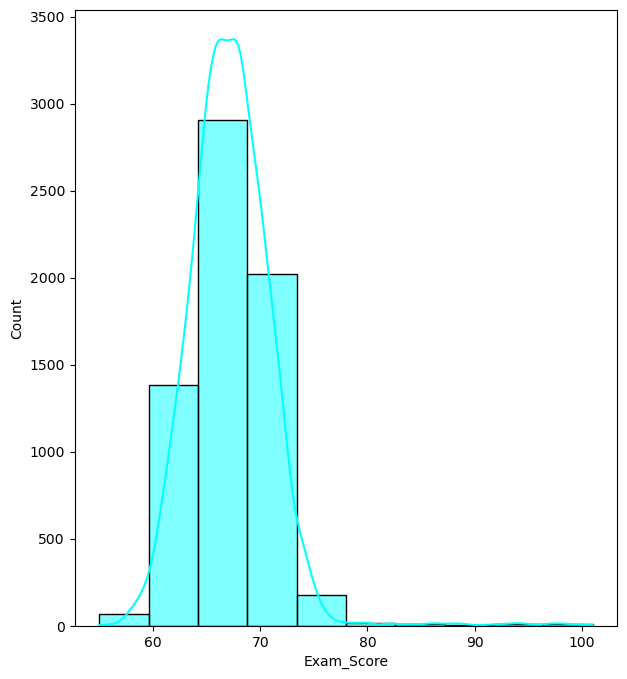

In [25]:
plt.figure(figsize=(7,8))
sns.histplot(data['Exam_Score'],bins=10,kde=True,color='aqua',edgecolor='black')

In [26]:
fig=px.violin(data,y='Exam_Score',box=True,hover_data=data.columns,title='exam_score'
              ,color_discrete_sequence=['green'])
fig.update_layout(yaxis_title='Exam_Score',title_font=dict(size=18,family='Arial'),template='plotly_white')
fig.show(renderer="notebook")

In [27]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [28]:
fig=make_subplots(rows=1,cols=1)
fig.add_trace(go.Box(x=data['Hours_Studied'],y=data['Exam_Score'],name='Hours_Studied Vs Exam Score'),
              row=1,col=1)
fig.add_trace(go.Box(x=data['Attendance'],y=data['Exam_Score'],name='Attendance Vs Exam_score'),
              row=1,col=1)

fig.update_layout(height=400,width=900)
fig.update_xaxes(title_text="Hours_Studied",row=1,col=1)
fig.update_yaxes(title_text='Exam_Score',row=1,col=1)
fig.update_xaxes(title_text='Attendance',row=1,col=1)
fig.update_yaxes(title_text='Exam_Score',row=1,col=1)
fig.show(renderer="notebook")

In [29]:
from sklearn.linear_model import LinearRegression,Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import Pipeline

In [30]:
X=standerd_data.drop(['Exam_Score'],axis=1)
y=standerd_data[['Exam_Score']]

In [31]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [32]:
Model=Pipeline([
    ('poly',PolynomialFeatures(degree=2,include_bias=False)),
    ('lin_reg',LinearRegression())]
)

In [33]:
Model.fit(X_train,y_train)

Pipeline(steps=[('poly', PolynomialFeatures(include_bias=False)),
                ('lin_reg', LinearRegression())])

In [34]:
y_pred=Model.predict(X_test)

In [35]:
print('mean_squared_error :',mean_squared_error(y_pred,y_test))
print('mean_absolute_error :',mean_squared_error(y_pred,y_test))
print('r2_score :',r2_score(y_pred,y_test))

mean_squared_error : 0.23542866589818995
mean_absolute_error : 0.23542866589818995
r2_score : 0.6781739147684865
